In [0]:
try:
  import tflearn # try to import tflearn 
except ImportError:
  !pip3 install -q tflearn # install tflearn first
  import tflearn # then import it

In [0]:
import matplotlib.pyplot as plt # used for plotting images 
import numpy as np # to do math funtions 
import os, sys # to interact with filesystem
import tensorflow as tf # tensorflow during training
from tflearn.activations import relu # rectified linear activation function

# normalizes data
from tflearn.layers.normalization import batch_normalization as bn
from scipy.misc import imread, bytescale, imresize # image manipulation functions
from tflearn.layers.core import input_data, dropout, fully_connected 
from tflearn.layers.conv import conv_2d, max_pool_2d, global_avg_pool
from tflearn.layers.estimator import regression # trainer for the network

# turns scalar label into vector where appropritate class is value 1 and others 0
from tflearn.data_utils import to_categorical

# makes new images from the ones we have by flipping them, rotating, etc.
from tflearn.data_augmentation import ImageAugmentation # basically so its "new" images so you can have more data to feed it

# to visualize the data space 
from tensorflow.contrib.tensorboard.plugins import projector

The next 4 code boxes are from github 

In [0]:
def install_tensorboard_dep():
  # installs tensorboard to be used in colabratory
  if 'ngrok-stable-linux-amd64.zip' not in os.listdir(os.getcwd()):
    !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
    !unzip ngrok-stable-linux-amd64.zip
    os.system('n')

In [0]:
def montage(x, plot_shape=(15, 15), return_grid=False, cmap='viridis'):
  '''
  Takes in a 4-D tensor, x, of shape [NxHxWxC] and puts all of the images
  together in a single matrix to show as one image. If return_grid is True, 
  it will not show the matrix, but return it to be used in some other 
  operations.
  '''
  
  count = 0
  if not return_grid:
    scale = [0, 255]
  else:
    scale = [0, 1]
  
  
  if len(x.shape) == 4 and x.shape[-1] == 3:
    num, m, n, c = x.shape
  else:
    num, m, n = x.shape
    c = 1
    
  num = int(np.ceil(np.sqrt(num)))
  grid = np.zeros([num*m, num*n, c])
  
  if c == 1:
    grid = grid[..., 0]
  
  for i in range(num):
    for j in range(num):
      if count < x.shape[0]:
        if c == 1:
          grid[i*m:i*m+m, j*n:j*n+n] = bytescale(x[count, ...], 
                                                 low=scale[0], high=scale[1])
        else:
          grid[i*m:i*m+m, j*n:j*n+n, :] = bytescale(x[count, ...],
                                                    low=scale[0], high=scale[1])
        count += 1 
        
  if return_grid:
    return grid
  else:
    fig = plt.figure(figsize=plot_shape)
    a1 = fig.add_subplot(111)
    a1.set_xticks(np.arange(-0.5, num*n, n))
    a1.set_yticks(np.arange(-0.5, num*m, m))
    a1.set_yticklabels([])
    a1.set_xticklabels([])
    a1.imshow(grid, cmap=cmap)
    plt.show()

In [0]:
def start_tensorboard():
  # starts tensorboard on colabratory 
  LOG_DIR = '/tmp/tflearn_logs' # where the log files will go 
  get_ipython().system_raw('tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'.format(LOG_DIR))
  get_ipython().system_raw('./ngrok http 6006 &')
  ! curl -s http://localhost:4040/api/tunnels | python3 -c \
  "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

In [0]:
def viz_embedding(tensor, images, labels, shape):
  
  tb_dir = '/tmp/tflearn_logs'
  sess = tf.Session()
  sess.run(tensor.initializer)
  summary_writer = tf.summary.FileWriter(tb_dir)
  config = projector.ProjectorConfig()
  embedding = config.embeddings.add()
  embedding.tensor_name = tensor.name
  embedding.metadata_path = os.path.join(tb_dir, 'metadata.tsv')
  embedding.sprite.image_path = os.path.join(tb_dir, 'flowers.png') 
  embedding.sprite.single_image_dim.extend(shape)
  projector.visualize_embeddings(summary_writer, config)
  saver = tf.train.Saver([tensor])
  saver.save(sess, os.path.join(tb_dir, 'flowers.ckpt'), 1)
  
  image_grid = montage(images, return_grid=True)
  plt.imsave(os.path.join(tb_dir, 'flowers.png'), image_grid)
  
  with open(os.path.join(tb_dir, 'metadata.tsv'),'w') as f:
    f.write("Index\tLabel\n")
    for index,label in enumerate(labels):
      f.write("%d\t%d\n" % (index,label))
  f.close()

In [40]:
response = input('Do you want to train a network? (y/n )')# ask user if they want to train new or load in existing

# if input was Y, y, Yes, or yes, Train a network. If not, load in a trained one 
if response in ['Y', 'y', 'Yes','yes']:
  Train = True
else: 
  Train = False 

Do you want to train a network? (y/n )y


In [41]:
print(Train)

True


In [0]:
# import dataset loader from tflearn
import tflearn.datasets.oxflower17 as oxflower17

# load the data in as X and the labels in as Y
X, Y = oxflower17.load_data(one_hot=True, resize_pics=(150,150)) 

In [43]:
print(X.shape, Y.shape) # print the shape of the data and labels 
print(Y[:10, ...]) # print first 10 label vectors 

# 1360 pictures, all 150x150, and have 3 color channels 
# seond row (row 1) the flower is flower 1 bc thats where the 1 is 
# 17 different classes of flowers

(1360, 150, 150, 3) (1360, 17)
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]


Text(0.5,1,'Blue Channel of Image')

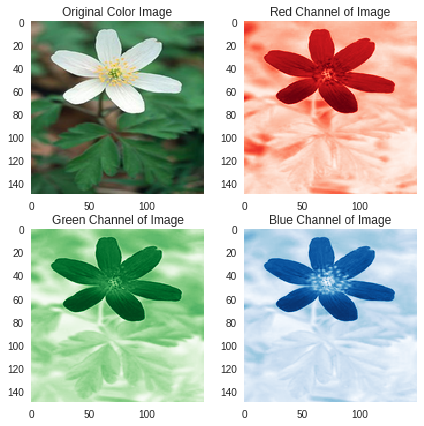

In [44]:
fig = plt.figure(figsize=(7,7)) # create a figure of size 7x7
a1 = fig.add_subplot(221) # add the first of four subplots in the figure
a2 = fig.add_subplot(222) # add the second of four subplots
a3 = fig.add_subplot(223) # add the third subplot
a4 = fig.add_subplot(224) # add the fourth of four subplots

x_show = X[0, :, :, :]

a1.imshow(bytescale(x_show)) # show the original image
a2.imshow(x_show[..., 0], cmap= 'Reds') # show the first color channel (red) of the image 
a3.imshow(x_show[..., 1], cmap= 'Greens') #show the second color channel (green) of the image 
a4.imshow(x_show[..., 2], cmap= 'Blues') # show the third color channel (blue) of the image

# remove the grid and tick lines 
a1.grid(False)
a2.grid(False)
a3.grid(False)
a4.grid(False)

# name each subplot
a1.set_title('Original Color Image')
a2.set_title('Red Channel of Image')
a3.set_title('Green Channel of Image')
a4.set_title('Blue Channel of Image')

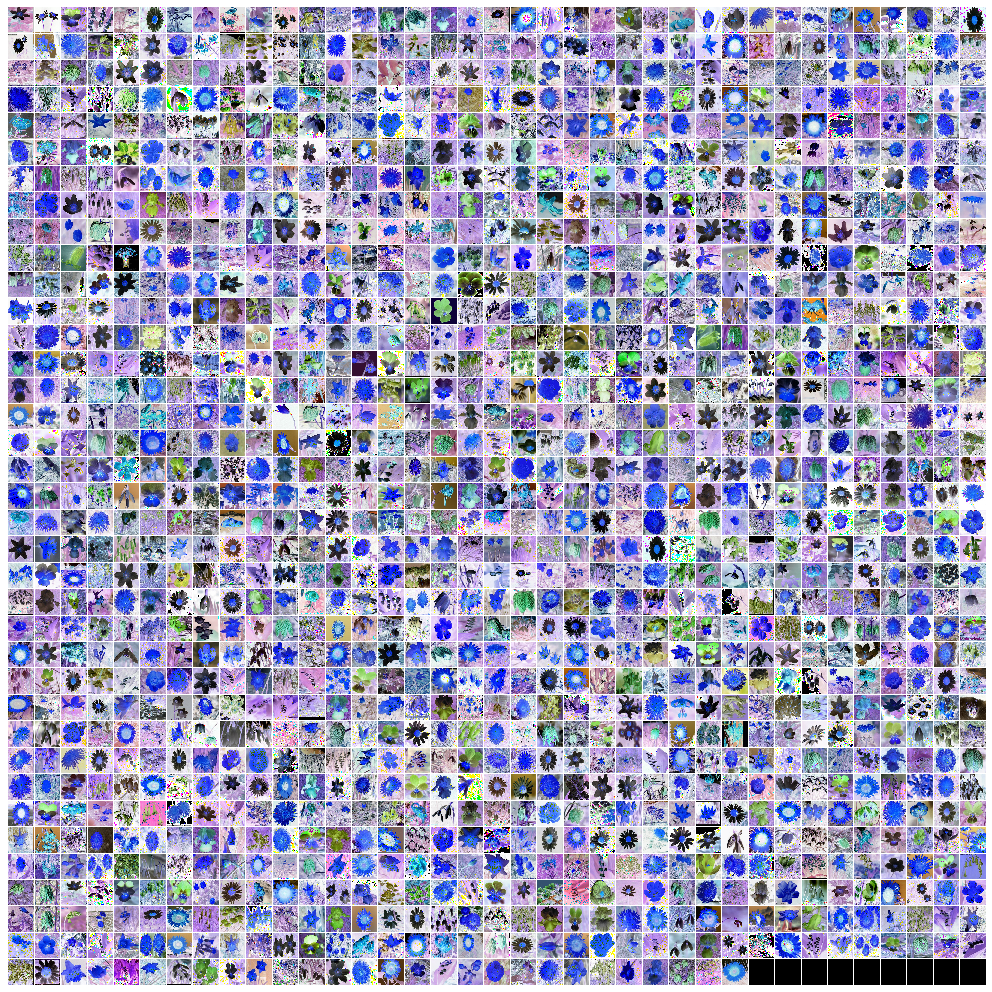

In [45]:
montage(X, (18,18)) # figure size is 18 by 18

In [0]:
# weight filter tells us what we are looking for across the image 
random_img = X[100, ...] # take the 100th image from the dataset
weight_filter = np.random.randn(5, 5, 3) # make random weights 5 pixels high by 5 pixels wide 
output_feature_map = np.zeros([random_img.shape[0], random_img.shape[1]]) # create empty feature map - the same shape as the image (not skipping any pixels)

In [0]:
for i in range(random_img.shape[0]-5):  # loop thru rows
  for j in range(random_img.shape[0]-5):  # loop thru columns 
    output_feature_map[i, j] = np.sum(weight_filter * random_img[i:i+5, j:j+5, :]) # weighted sum 
    
    # this is the math using the filter sliding over the pixels to make the feature map 

In [48]:
print(np.amax(output_feature_map), np.amin(output_feature_map))

4.786545523635192 -11.40861153555943


In [0]:
output_feature_map = bytescale(output_feature_map)

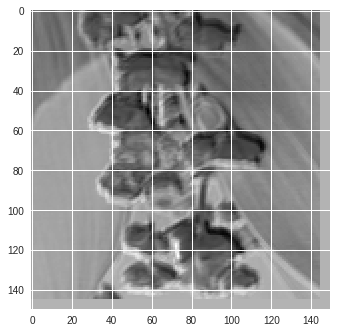

In [50]:
plt.imshow(output_feature_map, cmap='gray')

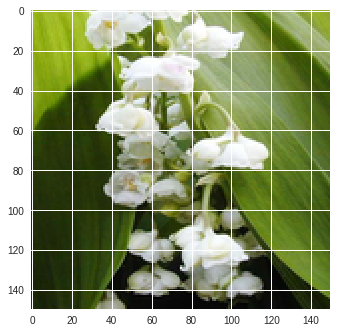

In [51]:
plt.imshow(random_img)

In [0]:
# make negative activation values 0 and keep positve ones - rectified linear activation (relu)
# saying for all negatives values give me a 0, and for all positive values give me a 1. Then multiply them by the actual values
   # in this way, all negative values will now be 0 * -number = 0
   # and all positive values will be 1 * actual number = actual number
    # i.e. relu 
output_feature_map = np.int32(output_feature_map > 0) * output_feature_map

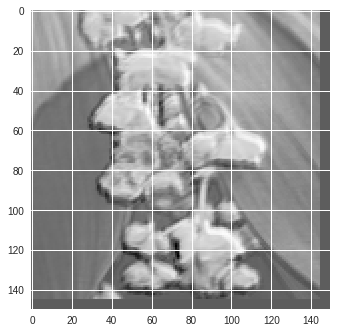

In [53]:
plt.imshow(np.float32(output_feature_map))

In [0]:
# normalize the data - squash it 
# preprocess by substracting mean and dividing by standard deviation
X -= np.mean(X, 0) # center each pixel value around 0
X /= np.std(X, 0) # squash each pixel to between -1 and 1

(array([8.500000e+02, 5.138000e+03, 1.051000e+04, 2.470000e+04,
        4.701700e+04, 7.110500e+04, 9.616400e+04, 1.266000e+05,
        1.608510e+05, 2.050860e+05, 2.683950e+05, 3.692080e+05,
        5.376400e+05, 7.226700e+05, 9.138930e+05, 1.098736e+06,
        1.186529e+06, 1.318422e+06, 1.722884e+06, 2.431531e+06,
        3.097694e+06, 2.965121e+06, 2.831162e+06, 2.743230e+06,
        2.668492e+06, 2.606106e+06, 2.552064e+06, 2.489257e+06,
        2.438255e+06, 2.380064e+06, 2.328364e+06, 2.275078e+06,
        2.218926e+06, 2.155254e+06, 2.095466e+06, 2.036052e+06,
        1.981007e+06, 1.921053e+06, 1.863709e+06, 1.814757e+06,
        1.759496e+06, 1.701705e+06, 1.643049e+06, 1.590127e+06,
        1.539017e+06, 1.487766e+06, 1.440046e+06, 1.396627e+06,
        1.358053e+06, 1.313772e+06, 1.274276e+06, 1.231587e+06,
        1.187696e+06, 1.147267e+06, 1.104276e+06, 1.068376e+06,
        1.030869e+06, 9.920090e+05, 9.207110e+05, 8.449240e+05,
        7.750940e+05, 6.923300e+05, 6.37

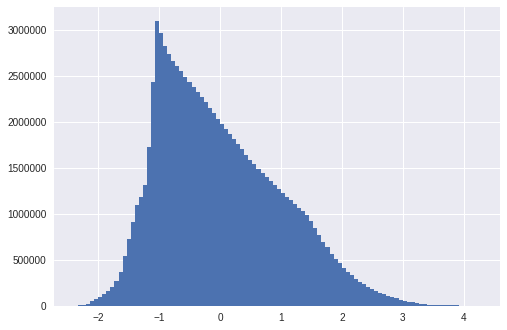

In [55]:
plt.hist(X.flatten(), bins=100) # view histogram of normalized data 

In [56]:
print(np.mean(X), np.std(X))

-1.2630929e-06 0.9999997


In [0]:
tf.reset_default_graph() # reset the tensorflow graph 

In [0]:
# augment images 
img_aug = ImageAugmentation()
img_aug.add_random_flip_leftright() # randomly flip some images left to right 
img_aug.add_random_rotation(max_angle=33.) # randomly rotate image up to 33 degrees 
img_aug.add_random_crop((150, 150), padding =15) # randomly crop a 120 x 120 frame out of the images 
# padding is like adding a black frame around it 

# image augmentation so that it doesn't get fixated on certain locations, etc.

The following is building a model to do CNN. Above was making convolution by hand. 

In [0]:
# create a layer to view data space in tensorboard
emb = tf.Variable(X[::10, ...], name = 'input_flower_images')

In [0]:
# tflearn documentation: tflearn.org 


# create input layer that takes in images and augments them as well
in_layer = input_data(shape=[None, 150, 150, 3], data_augmentation=img_aug) # none means don't expect a certain number of pictures
# 150 x 150,3 is color RGB

conv1 = conv_2d(in_layer, 64, 7, activation='linear', name = 'c1') # no activation in this layer (not yet)
# have 64, 7x7 filters slide over the input images (64 is arbitrary?)

# normalize conv1 layer feature maps 
batch_norm1 = bn(conv1, name='bn1') # bn is batch normalization 

# perform relu activation functions
relu1 = relu(batch_norm1) # drop out the negatives and make them 0s

# max pooling
pool1 = max_pool_2d(relu1, 3, 2) # looking at 3 pixels at a time (3x3) with stride of 2 

# second conv layer with 128, 3x3 filters
conv2 = conv_2d(pool1, 128, 3, activation='linear', name='c2') # usually people just double the conv from first layer to second, and filter size is smaller than first layr 

# second normalization layer
batch_norm2 = bn(conv2, name='bn2')

# second relu layer
relu2 = relu(batch_norm2)

# max pooling layer 2
pool2 = max_pool_2d(relu2, 3, 2)

# conv3 layer
conv3 = conv_2d(pool2, 256, 3, activation='linear', name='c3')

# normalize c3 layer
batch_norm3 = bn(conv3, name='bn3')

# relu on normalized c3 heat maps
relu3 = relu(batch_norm3)

# end up with num_images x 37 x 37 3 256 ---- 37x37 image but 256 views of it 

# take the average of each of the 256 feature maps --- num_images x 1 x 1 x 256
gap = global_avg_pool(relu3)

# output layer
out_layer = fully_connected(gap, 17, activation='softmax', name='fc') # 17 output nodes because there are 17 classes of flowers
# softmax turns output values into probabilities (on voice memo for more detail)



In [0]:
# describe how to optimize the network's weights 
network = regression(out_layer, optimizer='adam',
                    loss ='categorical_crossentropy', learning_rate = .001)

In [0]:
# we have laid out the roadwork like a blueprint, now we need to build it for real

# build the network based oon the description above 
model = tflearn.DNN(network, tensorboard_verbose=2) # DNN is deep neural network

In [63]:
# name for tensorboard 
tensorboard_name = 'flowers_cnn'
viz_embedding(emb, X[::10, ...], np.argmax(Y[::10, ...], 1), [150, 150, 3])


Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'ImageAugmentation' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'dict' object has no attribute 'name'


In [64]:
# start tensorboard 
install_tensorboard_dep()
start_tensorboard()

# may need to run this twice

http://5134660c.ngrok.io


In [65]:
if Train:
  model.fit(X, # input data
            Y, # corresponding labels 
            n_epoch=50, # number of times to go thru the whole dataset
            shuffle=True, # shuffle the images in each epoch
            validation_set=0.1, # take 10% randomly and use that as the testing/ validation set
            show_metric=True, # show validation accuracy/loss in tensorboard also
            batch_size=50, # go thru dataset 50 examples at a time
            run_id='OxfordFlowers_CNN') # name that will show up on tensorboard 
  
  # save the trained model for later as the name in red 
  model.save('flowers_CNN')

Training Step: 1249  | total loss: 0.62924 | time: 15.075s
| Adam | epoch: 050 | loss: 0.62924 - acc: 0.7894 -- iter: 1200/1224
Training Step: 1250  | total loss: 0.62652 | time: 16.681s
| Adam | epoch: 050 | loss: 0.62652 - acc: 0.7904 | val_loss: 0.88761 - val_acc: 0.7206 -- iter: 1224/1224
--
INFO:tensorflow:/content/flowers_CNN is not in all_model_checkpoint_paths. Manually adding it.


In [0]:
sess = tf.Session() # tensorflow session
sess.run(tf.global_variables_initializer())

In [0]:
# A function to retrieve feature maps with name layer_name from the model given input data.

def load_layer(layer_name, data):
  layer = sess.run(layer_name, {in_layer:data[None, ...]})
  print(layer.shape)
  return layer

In [0]:
# Takes in feature maps of shape NHWC and plots every one using the montage function.

def view_feature_map(layer):
  n, h, w , c = layer.shape # get layer's shape
  layer = layer.transpose((0, 3, 1, 2)).reshape([n*c, h, w])
  montage(layer, cmap='gray')

In [0]:
# choose 1 random number between 0 and the number of examples in the dataset
random_index = np.random.randint(0, X.shape[0], 1)[0]

# take out the image at that spot to use 
new_img = X[random_index, ...]

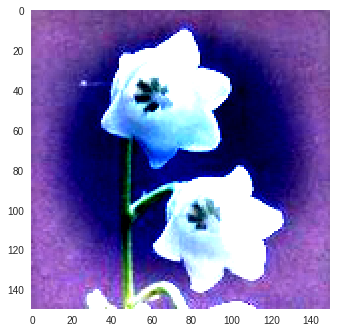

In [70]:
# view the original image
img_show = bytescale(new_img, 0, 1) # make values in new_img go between 0 and 1 to show it in matplotlib
plt.imshow(img_show)  # tell it what to show
plt.grid(False)  # get rid of the gridlines since this is not a graph
plt.show()  # show the image

(1, 150, 150, 64)


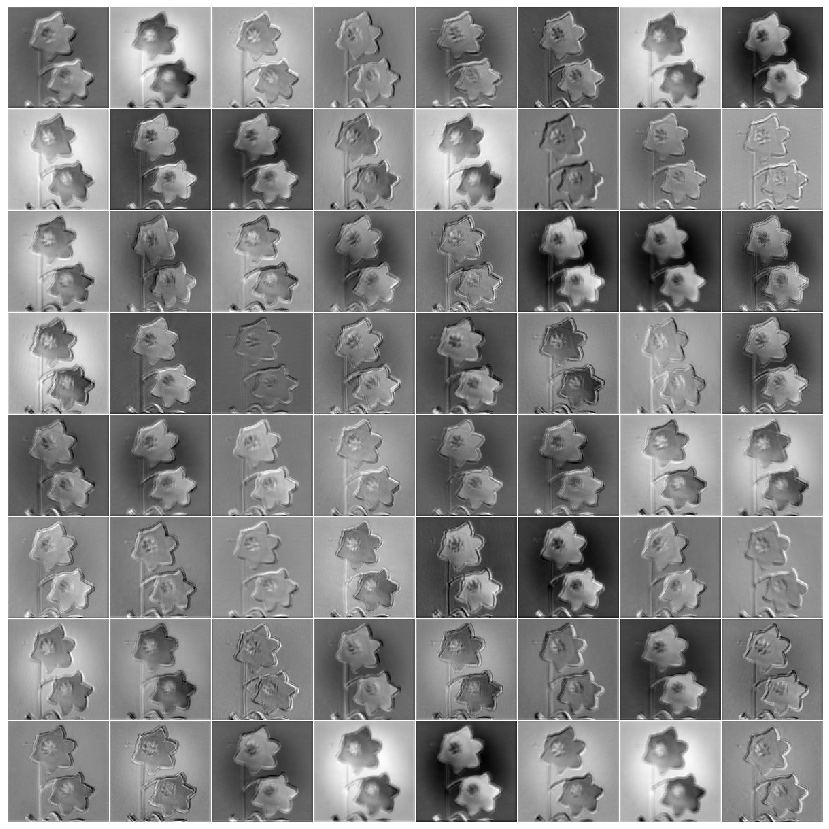

In [71]:
# view the first conv layer's feature maps --- 64 different views of the image to help decide what it is
view_feature_map(load_layer(conv1, new_img))

(1, 150, 150, 64)


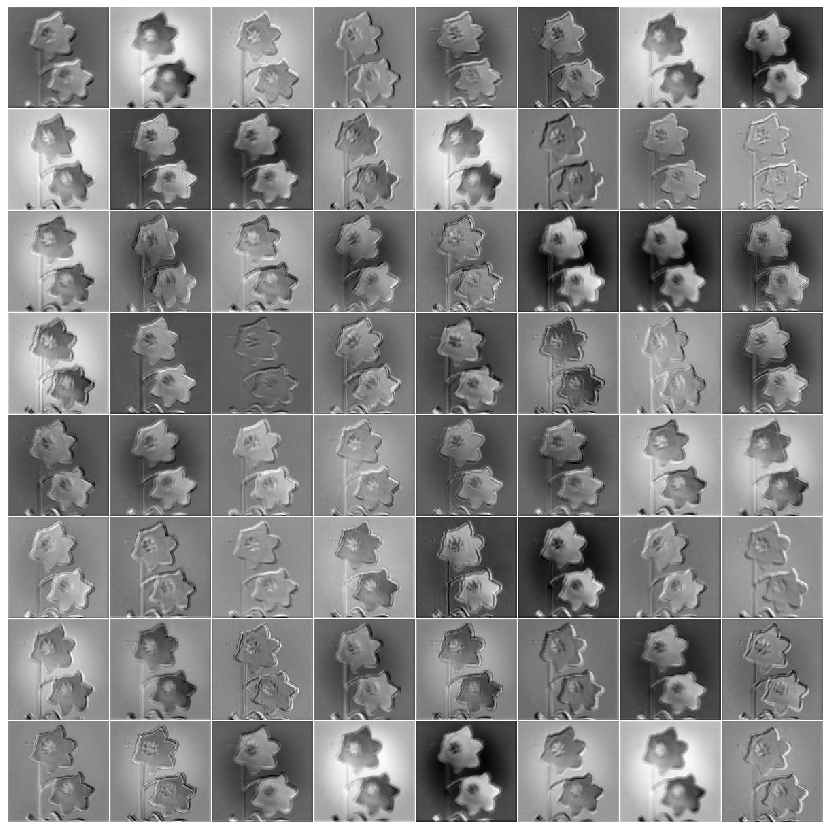

In [72]:
# view results of the normalization layer
view_feature_map(load_layer(batch_norm1, new_img))

The batch norm 1 feature maps are not much different than the input layer feature maps. This likely means that the data values were already close in their distribution.

(1, 150, 150, 64)


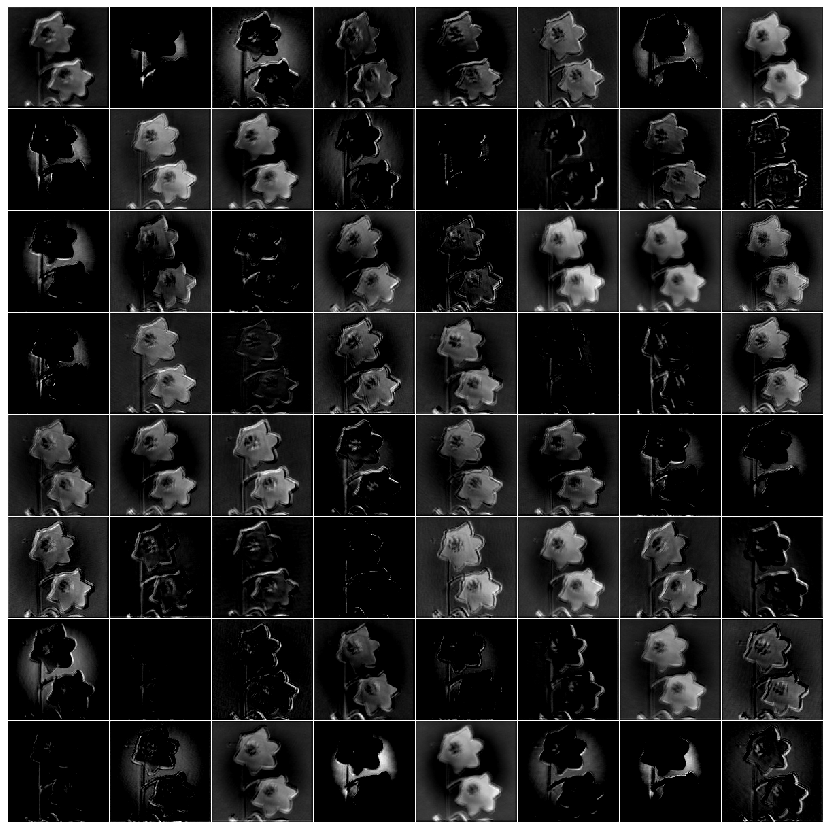

In [73]:
# view results of the rectified linear layer
view_feature_map(load_layer(relu1, new_img))

The relu1 feature maps are much darker than the batch_norm1 maps. This makes sense because the activation function took all the negative values and made them 0, which visually appear as black. The positive values still remain, which are shown as white or shades of gray in the feature maps.

(1, 75, 75, 64)


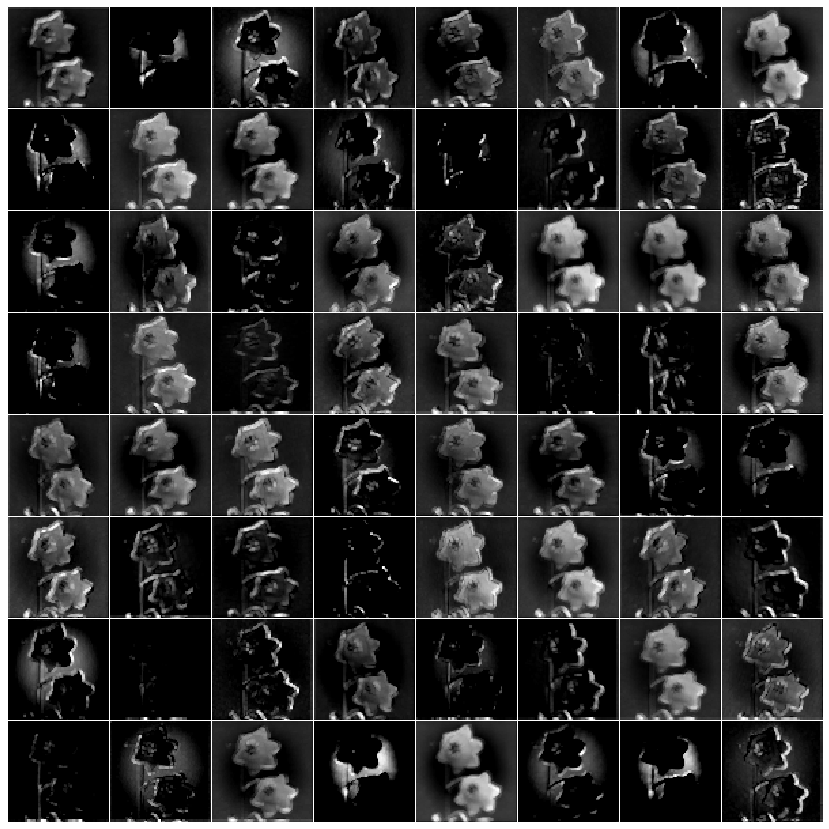

In [74]:
# view results of the pooling layer
view_feature_map(load_layer(pool1, new_img))

The pool1 feature maps are half the size of the relu1 maps. This is due to the nature of max pooling, as the filter took only the maximum value out of a 3x3 area of pixels and had a stride of 2. 

(1, 75, 75, 128)


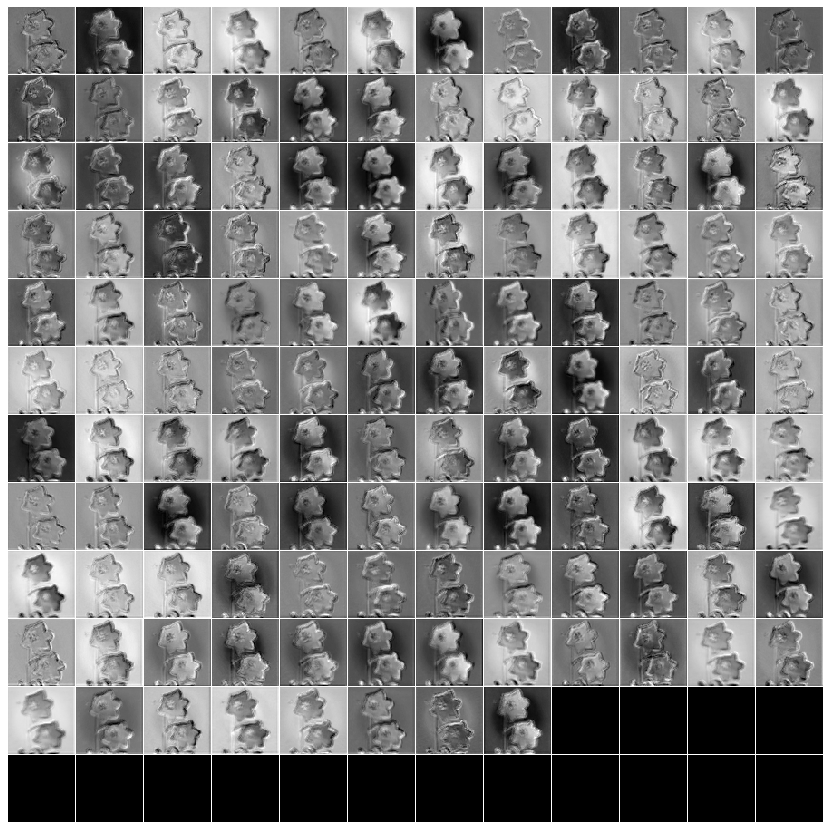

In [75]:
# view conv 2 feature maps 
view_feature_map(load_layer(conv2, new_img))

The conv2 maps have the same dimentions as in pool1, but the amount of feature maps has doubled. This is because in the conv2 layer there are 128, or 2 times 64, filters. 

(1, 75, 75, 128)


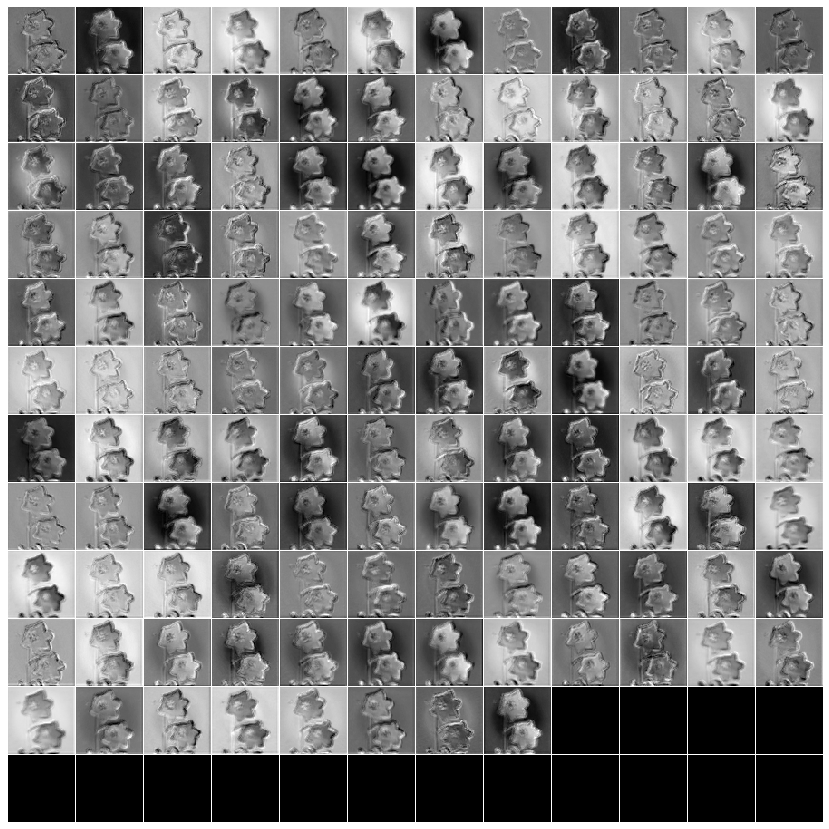

In [76]:
# view batch norm layer2 feature maps 
view_feature_map(load_layer(batch_norm2, new_img))

The batch_norm2 feature maps are very similar to the conv2 maps. Again, this seems to be due to the fact that the data distribution is already pretty normalized. 

(1, 75, 75, 128)


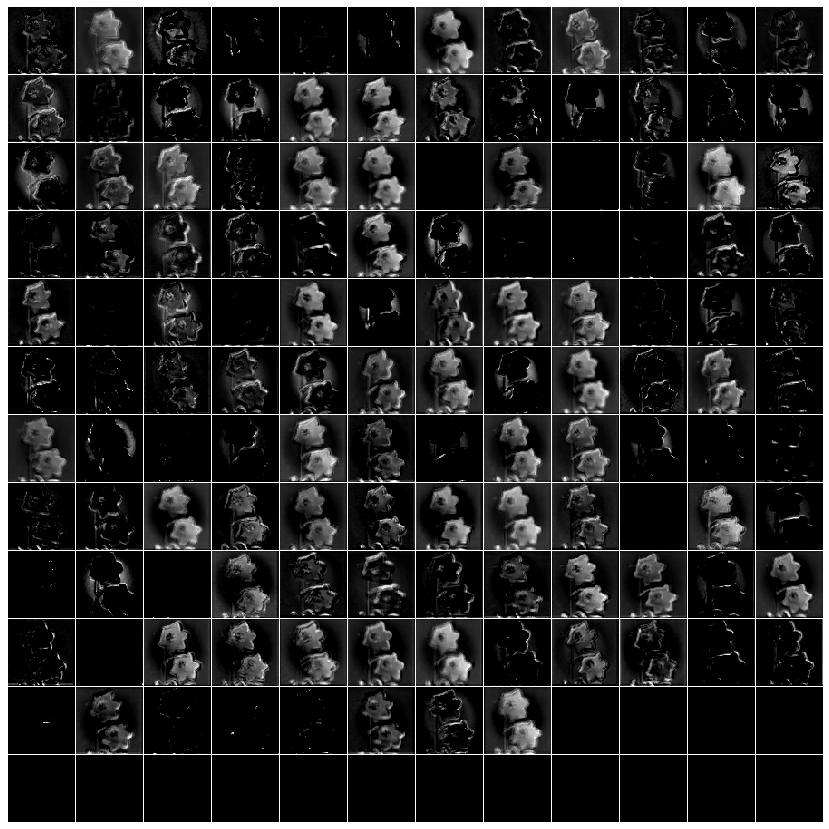

In [77]:
# view relu2 feature maps 
view_feature_map(load_layer(relu2, new_img))

Relu2 maps, again, are much darker than the batch_norm2 maps because of the activation function making the negative values 0. These layers help show more clearly the features that the filters had strongly identified in the images. 

(1, 38, 38, 128)


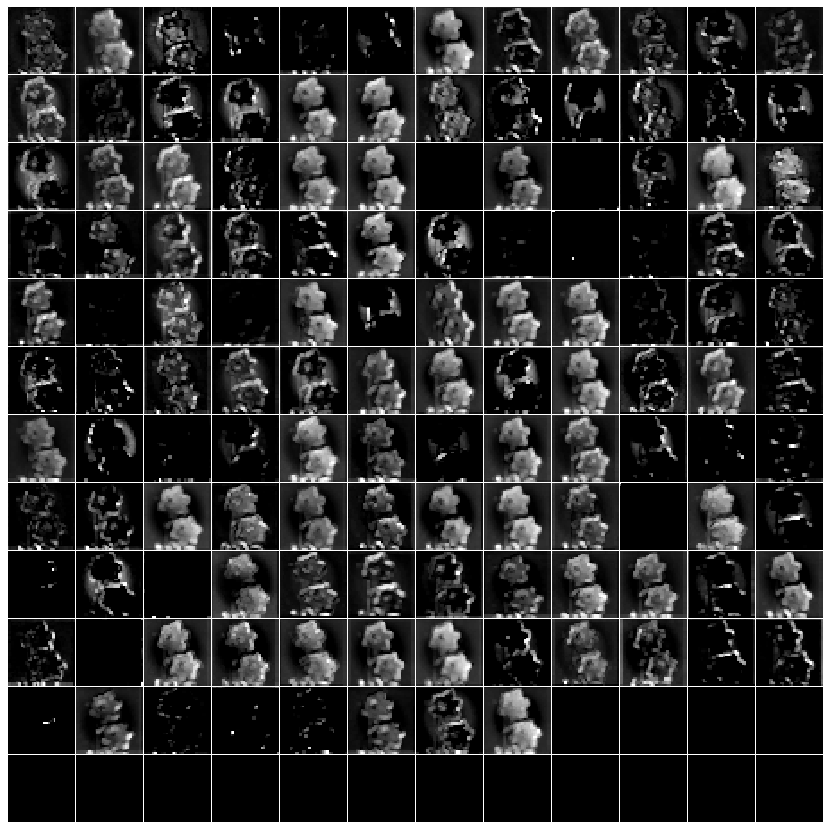

In [78]:
# view pool2 feature maps 
view_feature_map(load_layer(pool2, new_img))

Pool2 feature maps are half the size of the relu2 maps due to the max pooling with stride of 2. It is also worth noting that at 38x38 pixels, the images are becoming blury and grainy. This is likely due to the dimentionality being further reduced from 75x75 to just 38x38.  

(1, 38, 38, 256)


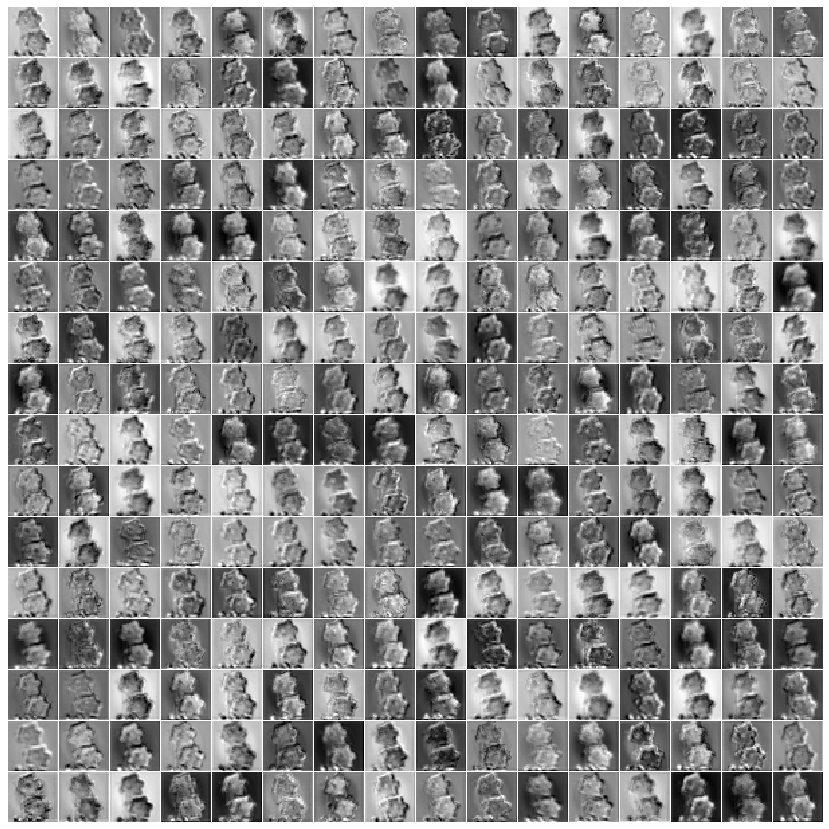

In [79]:
# view conv3 feature maps 
view_feature_map(load_layer(conv3, new_img))

The number of maps in conv3 yet again doubled from the previous layer, pool2. The filters are looking for more complex features, or even combinations of features at this point. 

(1, 38, 38, 256)


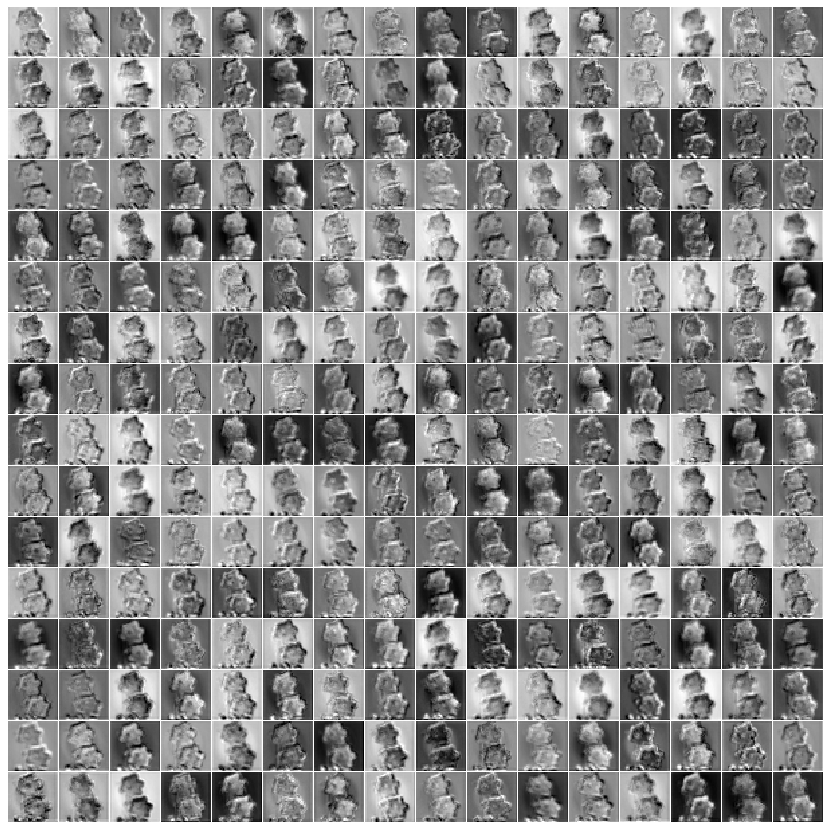

In [80]:
# view batch norm layer3 feature maps 
view_feature_map(load_layer(batch_norm3, new_img))

Batch_norm3 maps look just like the conv3 maps because the data was already normalized to begin with. 

(1, 38, 38, 256)


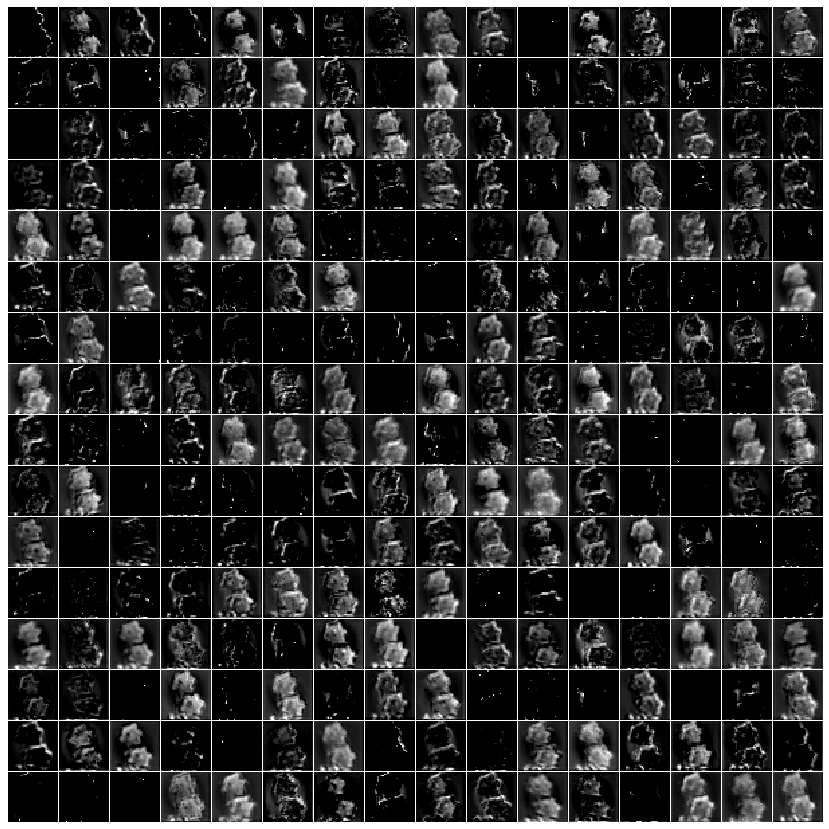

In [81]:
# view relu3 feature maps
view_feature_map(load_layer(relu3, new_img))

The relu3 layer is once again much darker than the batch3 layer due to the relu activation converting negative values to 0. You can see which parts of the images had the highest levels of activation and which areas had no activation. 